In [43]:
import mne # package for reading edf data
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt
# import pyeeg
from scipy.signal import butter, sosfiltfilt, sosfreqz  

from data_tools import * # i made all the functions into a python file"

In [44]:
subject = 2
trial = 3
fs = 1000.      # sampling rate
lowcut = 0.1    # 0.1 Hz is the lowest frequency we will pass
highcut = 30    # 30 is our highest 
order=2         # TODO figure out the optimal order for the future


df = get_recording_events(subject, trial)
df = df[df.song_clip==29].drop(columns=['song_clip','Number','TARGET','time'])
df

Extracting EDF parameters from c:\Users\Staro\Documents\GitHub\COGS189-final-project\data\sub-02\eeg\sub-02_task-run3_eeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
c:\Users\Staro\Documents\GitHub\COGS189-final-project\data_tools.py:16: RuntimeWarning: Invalid date encountered (2014-00-00 00:00:00).
  data = mne.io.read_raw_edf(fileName)


,FP1,FP2,F7,F3,Fz,F4,F8,T3,C3,Cz,C4,T4,T5,P3,Pz,P4,T6,O1,O2
0,-149.623601,-111.775574,49.314735,-1.279259,-65.707514,-49.011326,-12.416786,10.371734,-32.831533,-28.469000,-12.807568,9.759761,-35.782211,-16.815982,8.581891,72.525610,49.671773,102.469989,-2.850259
1,-173.877896,-116.794177,33.418188,-1.556187,-69.779909,-51.001599,-13.867926,31.866286,-24.871664,-25.202006,-11.848305,12.467998,-16.045504,-4.362878,12.894548,76.087524,50.927955,112.681901,2.977428
2,-175.805390,-118.389954,64.473467,-7.593208,-69.412832,-52.480088,-16.696420,13.820617,-5.290389,-25.539442,-15.896393,9.736810,-9.136154,3.951592,12.663714,72.600796,39.190897,109.743665,-2.839427
3,-170.906344,-119.754459,54.479436,-3.910071,-68.782323,-53.006089,-20.090613,-8.301004,1.594897,-25.505698,-18.966032,4.871165,-7.288654,6.899788,14.493496,71.651578,32.960740,111.808649,-2.427806
4,-162.594027,-116.215997,87.748158,-12.411747,-72.142157,-50.020679,-13.720352,21.206103,-17.349589,-25.766444,-14.610981,10.517150,-4.494874,3.421475,13.761583,74.085710,37.845894,114.674970,1.200959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15996,-246.118752,-71.002319,-68.266054,-88.566823,-9.384956,-2.481576,-35.143119,-33.627648,-80.909136,-21.091422,-37.000165,17.976275,-37.900077,-38.746095,7.382679,61.454542,-5.194215,76.097780,-10.216109
15997,-243.147199,-67.764510,-65.784314,-91.696104,-7.847552,0.247942,-32.708155,-32.547695,-83.615492,-22.468774,-38.189650,15.956573,-39.056642,-39.899332,7.804937,62.206397,-1.501800,74.001975,-4.648393
15998,-236.400971,-61.473912,-61.089132,-105.459403,-3.969492,1.484755,-28.600690,-30.736161,-84.610475,-21.839916,-37.901871,11.595854,-35.586947,-36.662827,7.652924,63.578533,-2.757982,86.124767,2.825779
15999,-238.248153,-61.867074,-58.808614,-96.902342,-4.798654,2.167134,-27.493888,-31.676765,-80.391745,-20.373604,-39.264024,14.900820,-33.499122,-33.435622,10.715699,64.264601,-2.757982,92.422455,3.248232


<AxesSubplot:title={'center':'raw eeg readings'}>

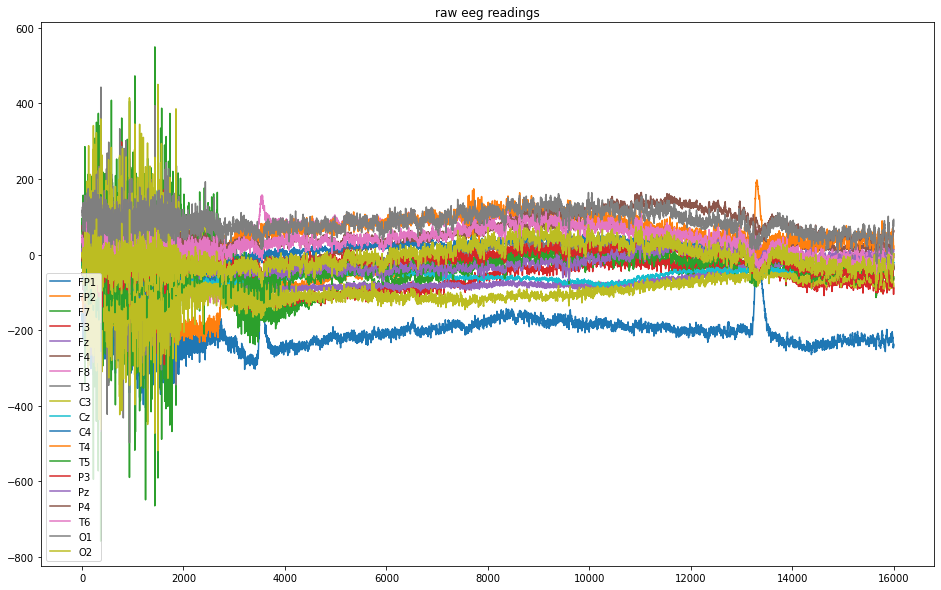

In [84]:
df.plot(figsize=(16,10), title='raw eeg readings') # this is too raw to use!

<AxesSubplot:>

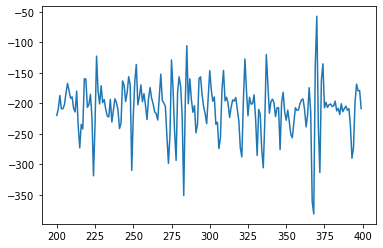

In [85]:
df.FP1[200:400].plot() # lets take a stare at a smaller segment

In [86]:
# this will be our bread and butter
def butter_bandpass(lowcut, highcut, fs, order = 2):
        nyq = 0.5 * fs
        low = lowcut / nyq
        high = highcut / nyq
        sos = butter(order, [low, high], analog = False, btype = 'band', output = 'sos')
        return sos

def butter_bandpass_filter(data, lowcut, highcut, fs, order = 2):
        sos = butter_bandpass(lowcut, highcut, fs, order = order)
        y = sosfiltfilt(sos, data)
        return y

<AxesSubplot:title={'center':'filtered eeg readings (between .1 and 30 hz)'}>

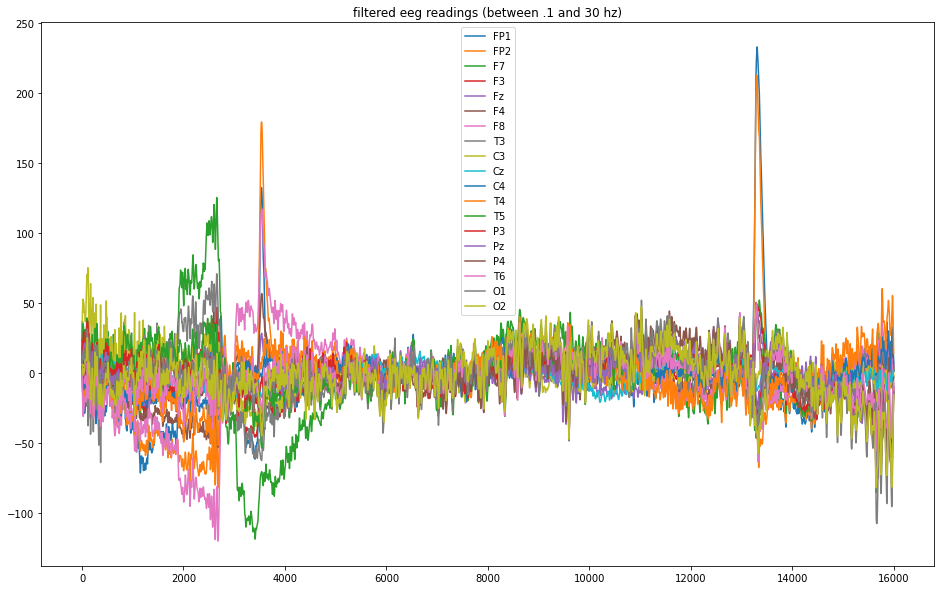

In [87]:
# from 0.1 to 30 hz
filtered_df = df.apply(lambda x: butter_bandpass_filter(x, lowcut, highcut, fs, order))
filtered_df.plot(figsize=(16,10), title='filtered eeg readings (between .1 and 30 hz)')

<AxesSubplot:title={'center':'delta graph'}>

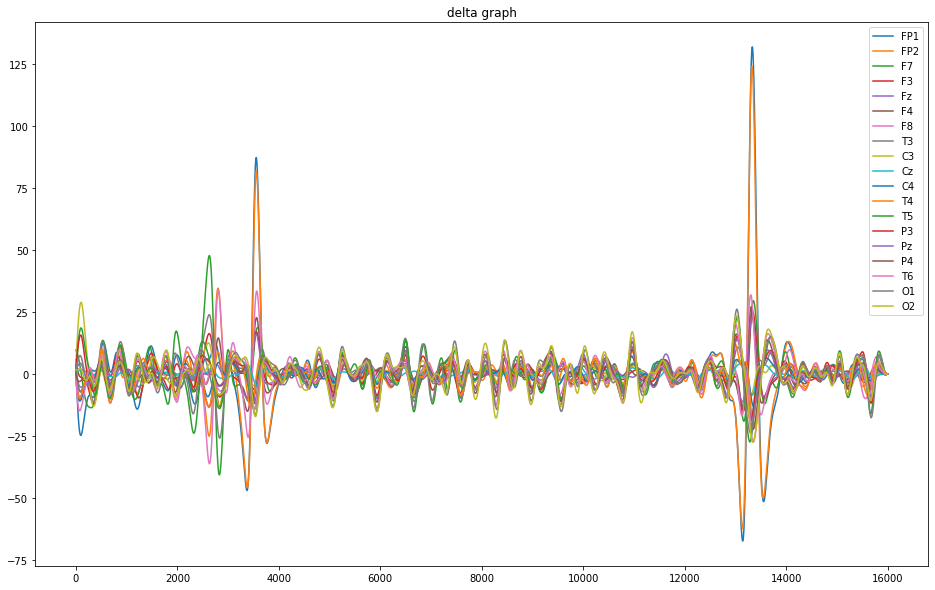

In [88]:
# from 1 to 4 hz (delta)
deltadf = df.apply(lambda x: butter_bandpass_filter(x, 1, 4, fs, order))
deltadf.plot(title='delta graph',figsize=(16,10))

<AxesSubplot:title={'center':'theta graph'}>

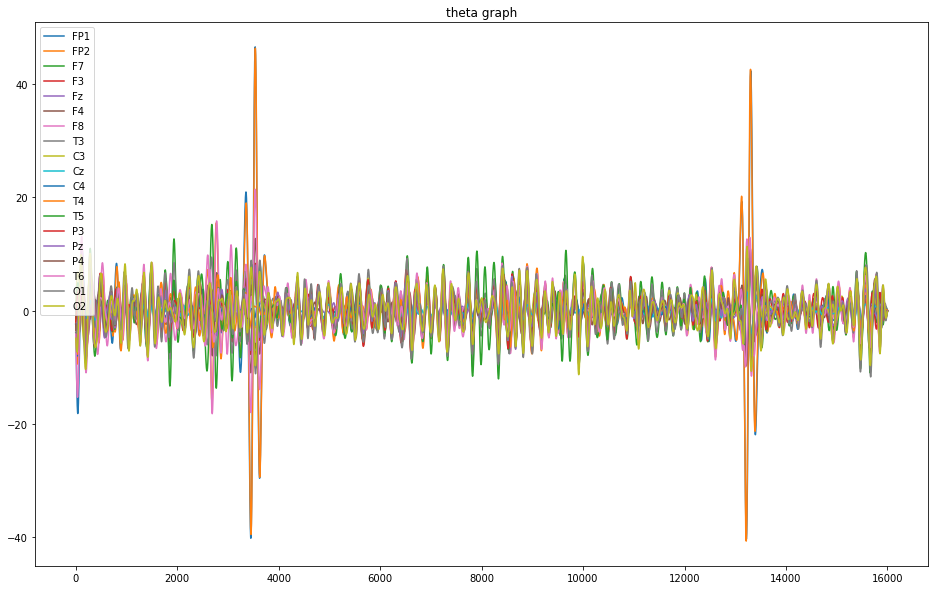

In [89]:
# from 4 to 8 hz (theta)
thetadf = df.apply(lambda x: butter_bandpass_filter(x, 4, 8, fs, order))
thetadf.plot(title='theta graph',figsize=(16,10))

<AxesSubplot:title={'center':'alpha graph'}>

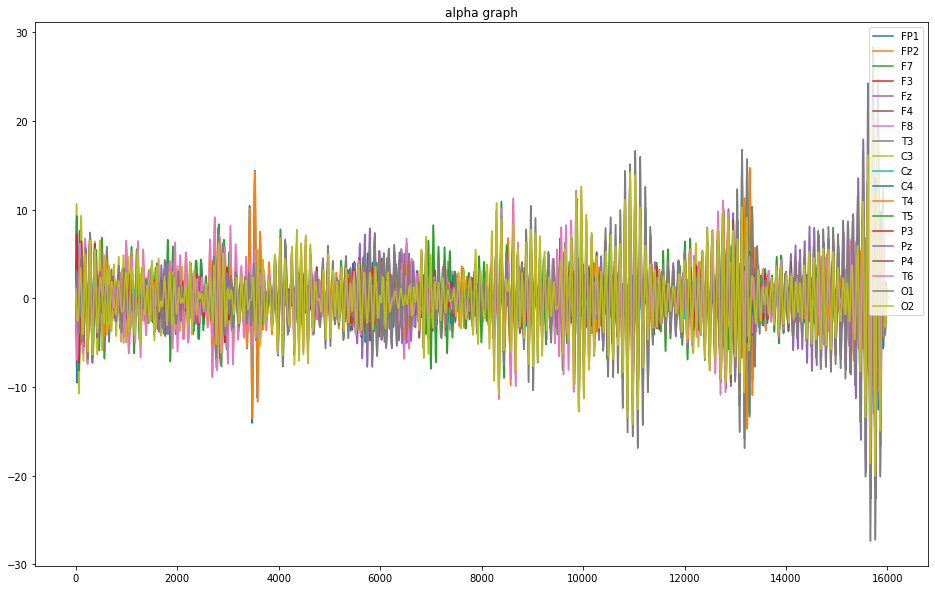

In [90]:
# from 8 to 12 hz (alpha)
alphadf = df.apply(lambda x: butter_bandpass_filter(x, 8, 12, fs, order))
alphadf.plot(title='alpha graph',figsize=(16,10))

<AxesSubplot:title={'center':'beta graph'}>

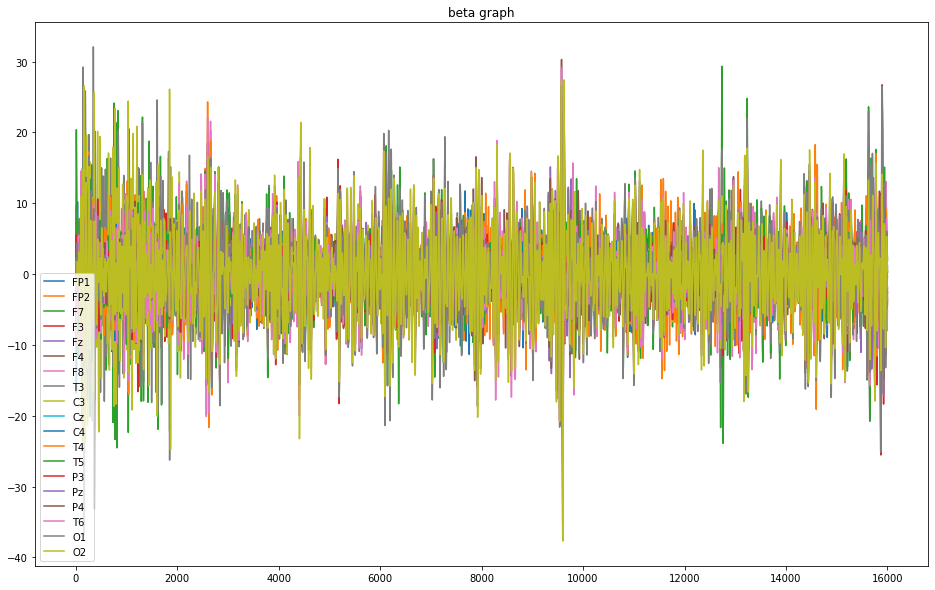

In [91]:
# from 12 to 30 hz (beta)
betadf = df.apply(lambda x: butter_bandpass_filter(x, 12, 30, fs, order))
betadf.plot(title='beta graph',figsize=(16,10))

<AxesSubplot:>

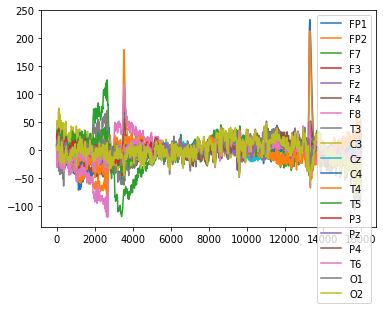

In [92]:
filtered_df.plot()



In [104]:
band = [4,8,12,16,25,45] #5 bands
band_labels = ['theta','alpha','beta','beta2','gamma'] #5 bands
window_size = 2000 #Averaging band power of 2 sec
step_size = 125 #Each 0.125 sec update once
sample_rate = 1000 #Sampling rate of 128 Hz
#List of subjects

In [105]:
# df_ = pd.DataFrame(index=df.index)
# for column in df.columns:
#     df_[['Cz_deltapower','Cz_thetapower','Cz_alphapower','Cz_betapower','Cz_betapower']] = df[column].groupby(df.index // window_size).apply(lambda x: quick_bin_power(x, band, sample_rate)[0])
df_

0    theta    0.000000
     alpha    0.897088
     beta     0.000000
     beta2    0.046823
     gamma    0.056089
                ...   
160  theta         NaN
     alpha         NaN
     beta          NaN
     beta2         NaN
     gamma         NaN
Name: Cz, Length: 805, dtype: float64

In [106]:
df['Cz'].groupby(df.index // window_size).apply(lambda x: quick_bin_power(x, band, sample_rate))

c:\Users\Staro\Documents\GitHub\COGS189-final-project\data_tools.py:109: RuntimeWarning: invalid value encountered in true_divide
  Power_Ratio = Power / sum(Power)


0    ([7770.514653977563, 5629.463758578385, 3319.8...
1    ([3446.835853031944, 2624.835834615404, 3618.3...
2    ([3690.307614962491, 4896.062341556314, 1765.7...
3    ([4108.031482109555, 5115.922618105653, 4246.7...
4    ([5637.062513934159, 3063.556270860741, 2982.7...
5    ([7210.694213586544, 7292.177784986714, 3645.8...
6    ([5277.194431658489, 5655.001750813668, 2358.7...
7    ([4308.351322651237, 7417.0736601082135, 3635....
8    ([0.0, 0.0, 0.0, 0.0, 0.0], [nan, nan, nan, na...
Name: Cz, dtype: object

In [107]:
def ratio_bin_power(X, Band, Fs):
    C = np.fft.fft(X)
    C = abs(C)
    Power = np.zeros(len(Band) - 1)
    for Freq_Index in range(0, len(Band) - 1):
        Freq = float(Band[Freq_Index])
        Next_Freq = float(Band[Freq_Index + 1])
        Power[Freq_Index] = sum(
            C[int(np.floor(Freq / Fs * len(X))): 
                int(np.floor(Next_Freq / Fs * len(X)))]
        )
    Power_Ratio = Power / sum(Power)
    # return Power, Power_Ratio
    return Power_Ratio
    
def power_bin_power(X, Band, Fs):
    C = np.fft.fft(X)
    C = abs(C)
    Power = np.zeros(len(Band) - 1)
    for Freq_Index in range(0, len(Band) - 1):
        Freq = float(Band[Freq_Index])
        Next_Freq = float(Band[Freq_Index + 1])
        Power[Freq_Index] = sum(
            C[int(np.floor(Freq / Fs * len(X))): 
                int(np.floor(Next_Freq / Fs * len(X)))]
        )
    Power_Ratio = Power / sum(Power)
    # return Power, Power_Ratio
    return Power

In [135]:
df_ = df.copy()
output = None
for col in df_.columns:
    colvals = df_[col].groupby(df.index //step_size).apply(lambda x: pd.Series(ratio_bin_power(x, band, sample_rate), index=[str(col)+'_'+b+'_ratio' for b in band_labels])).unstack()
    # print(colvals)
    if output is not None:
        # print('merging')
        output = output.merge(colvals, left_index=True, right_index=True)
    else:
        # print('assigning')
        output = colvals
output

C:\Users\Staro\.virtualenvs\project-5NQxielR\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


,FP1_theta_ratio,FP1_alpha_ratio,FP1_beta_ratio,FP1_beta2_ratio,FP1_gamma_ratio,FP2_theta_ratio,FP2_alpha_ratio,FP2_beta_ratio,FP2_beta2_ratio,FP2_gamma_ratio,...,O1_theta_ratio,O1_alpha_ratio,O1_beta_ratio,O1_beta2_ratio,O1_gamma_ratio,O2_theta_ratio,O2_alpha_ratio,O2_beta_ratio,O2_beta2_ratio,O2_gamma_ratio
0,0.953011,0.0,0.010104,0.011690,0.025194,0.932482,0.0,0.017907,0.016008,0.033603,...,0.924064,0.0,0.027337,0.019650,0.028949,0.126517,0.0,0.365970,0.142278,0.365235
1,0.947270,0.0,0.013608,0.014104,0.025018,0.930224,0.0,0.018570,0.017643,0.033563,...,0.869840,0.0,0.024625,0.072969,0.032567,0.588294,0.0,0.081282,0.205044,0.125380
2,0.935039,0.0,0.016689,0.011838,0.036435,0.904325,0.0,0.021683,0.010642,0.063350,...,0.827320,0.0,0.062207,0.015179,0.095295,0.439457,0.0,0.199823,0.023245,0.337475
3,0.979285,0.0,0.004116,0.002280,0.014319,0.968880,0.0,0.013090,0.004973,0.013057,...,0.902346,0.0,0.041159,0.018424,0.038070,0.722053,0.0,0.166151,0.037623,0.074173
4,0.957305,0.0,0.015236,0.008086,0.019373,0.932949,0.0,0.032616,0.006662,0.027772,...,0.890693,0.0,0.043017,0.030581,0.035709,0.691320,0.0,0.127630,0.075396,0.105655
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124,0.965688,0.0,0.015797,0.004795,0.013720,0.854173,0.0,0.072255,0.016848,0.056724,...,0.821999,0.0,0.107900,0.030186,0.039914,0.777418,0.0,0.107941,0.027294,0.087347
125,0.943629,0.0,0.021778,0.019916,0.014677,0.765920,0.0,0.079736,0.056722,0.097621,...,0.431337,0.0,0.248704,0.163811,0.156148,0.697282,0.0,0.154578,0.045266,0.102874
126,0.926578,0.0,0.031372,0.012563,0.029487,0.764257,0.0,0.113387,0.019761,0.102595,...,0.658699,0.0,0.232245,0.055910,0.053145,0.685734,0.0,0.196523,0.047068,0.070676
127,0.955359,0.0,0.016340,0.003488,0.024813,0.839212,0.0,0.006245,0.034792,0.119751,...,0.662288,0.0,0.188183,0.022790,0.126739,0.632997,0.0,0.203921,0.053212,0.109869


In [127]:
col = 'Cz'
df_[col].groupby(df.index //100).apply(lambda x: pd.Series(ratio_bin_power(x, band, sample_rate), index=[str(col)+'_'+b for b in band_labels])).unstack()

C:\Users\Staro\.virtualenvs\project-5NQxielR\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


,Cz_theta,Cz_alpha,Cz_beta,Cz_beta2,Cz_gamma
0,0.0,0.897088,0.0,0.046823,0.056089
1,0.0,0.869302,0.0,0.060028,0.070669
2,0.0,0.904282,0.0,0.041994,0.053724
3,0.0,0.948720,0.0,0.028556,0.022725
4,0.0,0.909523,0.0,0.060747,0.029730
...,...,...,...,...,...
156,0.0,0.864786,0.0,0.089434,0.045780
157,0.0,0.876146,0.0,0.071102,0.052753
158,0.0,0.862779,0.0,0.083116,0.054105
159,0.0,0.847990,0.0,0.060777,0.091233


In [109]:
for column in df.columns:
    print(str(column)+'_band')

FP1_band
FP2_band
F7_band
F3_band
Fz_band
F4_band
F8_band
T3_band
C3_band
Cz_band
C4_band
T4_band
T5_band
P3_band
Pz_band
P4_band
T6_band
O1_band
O2_band


In [111]:
[str(column)+'_'+b for b in band_labels]

['O2_theta', 'O2_alpha', 'O2_beta', 'O2_beta2', 'O2_gamma']

what I plan to do is to 

1. split the data by band pass filters, resulting in a dataframe of 16000 rows of alpha, beta, and theta values at each point DONE


# Feature Space Ideas: 
- descriptive statistics for important eeg nodes
- correlations between nodes
- alpha and theta levels? possibly beta? done
- fast fourier? done
- dwt? 


## --prototyping garbage below--

Delta
Theta
Alpha
Beta
Gamma


Text(0, 0.5, 'Mean band Amplitude')

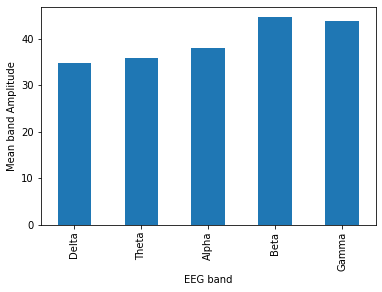

In [11]:

# data = np.random.uniform(0, 100, 1024)  # 2 sec of data b/w 0.0-100.0

# Get real amplitudes of FFT (only in postive frequencies)
fft_vals = np.absolute(np.fft.rfft(df[['Cz']]))

# Get frequencies for amplitudes in Hz
fft_freq = np.fft.rfftfreq(len(df[['Cz']]), 1.0/fs)
eeg_bands = {'Delta': (0, 4),
             'Theta': (4, 8),
             'Alpha': (8, 12),
             'Beta': (12, 30),
             'Gamma': (30, 45)}

# Take the mean of the fft amplitude for each EEG band
eeg_band_fft = {}
for band in eeg_bands.keys():  
    print(band)
    freq_ix = np.where((fft_freq >= eeg_bands[band][0]) & 
                       (fft_freq <= eeg_bands[band][1]))[0]
    eeg_band_fft[band] = np.max(fft_vals[freq_ix])

# Plot the data (using pandas here cause it's easy)
import pandas as pd
df_ = pd.DataFrame(columns=['band', 'val'])
df_['band'] = eeg_bands.keys()
df_['val'] = [eeg_band_fft[band] for band in eeg_bands.keys()]
ax = df_.plot.bar(x='band', y='val', legend=False)
ax.set_xlabel("EEG band")
ax.set_ylabel("Mean band Amplitude")

In [12]:
np.fft.rfft(df[['Cz']])

array([[-28.46900003+0.j],
       [-25.202006  +0.j],
       [-25.539442  +0.j],
       ...,
       [-21.83991637+0.j],
       [-20.37360356+0.j],
       [-20.99325877+0.j]])

In [13]:
df[['Cz']]

,Cz
0,-28.469000
1,-25.202006
2,-25.539442
3,-25.505698
4,-25.766444
...,...
15996,-21.091422
15997,-22.468774
15998,-21.839916
15999,-20.373604


In [14]:
def power_level(x_):
    x = np.abs(x_)
    if 0<=x and x<4:
        return 'delta'#0 #delta
    if 4<=x and x<8:
        return 'theta'#1 #theta
    if 8<=x and x<12:
        return 'alpha'#2 #alpha
    if 12<=x and x<30:
        return 'beta'#3 #beta 
    if 30<x:
        return 'gamma'#4 #gamma
    # return 'omega_lul'#-1 #omega (couldnt classify under any of them)
# testdf = testdf.merge(testdf.applymap(power_level), left_index=True, right_index=True, suffixes=['','_power'])
testdf

NameError: name 'testdf' is not defined